In [54]:
import torch
from PIL import Image
import argparse
import pandas as pd
from utils import get_base_model_image_size
import os
from lime.lime_image import LimeImageExplainer
from skimage.segmentation import mark_boundaries
import numpy as np
import matplotlib.pyplot as plt
from xai_methods import (xai_integrated_gradients, find_last_conv_layer_pytorch, get_image_array)
import sys
from scratchpad import *
from xai_methods import predictdata
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2

MODEL = None
TRAIN_TRANSFORM = None
VALID_TRANSFORM = None
LAYER_NAMES = None
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
import sys
if __name__ == '__main__':
    parser = argparse.ArgumentParser(description="Obtain the original model path and the revised model path")
    parser.add_argument("--org_model_path", type=str, default=None, help="Specify a model name to override the default model")
    parser.add_argument("--modified_model_path", type=str, default=None, help="Specify a model name to override the default model")
    parser.add_argument("--model_name", type=str, default=None, help="Specify a model name to override the default model")
    parser.add_argument("--save_dir", type=str, default=None, help="Specify a save directory to save the results")
    sys.argv = ['notebook', '--org_model_path', '/home/srikanth/trained_models/pytorch/vgg16/vgg16.pth', 
    '--modified_model_path', '/mnt/data/results/vgg16/loss_vgg16_features.12_0.5.pth',
    "--model_name", "vgg16",
    "--save_dir", "./lime"]

    args = parser.parse_args([
        "--org_model_path", "/home/srikanth/trained_models/pytorch/vgg16/vgg16.pth",
        "--modified_model_path", "/mnt/data/results/vgg16/loss_vgg16_features.12_0.5.pth",
        "--model_name", "vgg16",
        "--save_dir", "./integrated_gradient"
    ])
    BASE_MODEL_PATH = args.org_model_path.strip()
    MODIFIED_MODEL_PATH = args.modified_model_path.strip()
    MODEL_NAME = args.model_name.strip().lower()
    save_dir = args.save_dir.strip()
    model = torch.load(BASE_MODEL_PATH).to(device)
    return_value = find_last_conv_layer_pytorch(model)
    model.eval()
    num_classes = 3
    save_dir_before = os.path.join(save_dir, MODEL_NAME+'/before')
    for i in range(num_classes):
        os.makedirs(save_dir_before +f'/{i}', exist_ok=True)
    model_modified = torch.load(BASE_MODEL_PATH)
    model_modified.load_state_dict(torch.load(MODIFIED_MODEL_PATH, weights_only=True))
    return_value = find_last_conv_layer_pytorch(model_modified)
    model_modified.eval()
        
    save_dir_after = os.path.join(save_dir, MODEL_NAME+'/after')
    for i in range(num_classes):
        os.makedirs(save_dir_after +f'/{i}', exist_ok=True)
    


/tmp/ipykernel_3611218/3652557786.py:48: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(BASE_MODEL_PATH).to(device)


Last Conv2d layer: features.28 - Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


/tmp/ipykernel_3611218/3652557786.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_modified = torch.load(BASE_MODEL_PATH)


Last Conv2d layer: features.28 - Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


In [55]:
def show_cam_on_image(img, heatmap):
    heatmap = cv2.resize(heatmap, (img.width, img.height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    # Convert PIL image to OpenCV format
    img_cv = np.array(img)
    img_cv = cv2.cvtColor(img_cv, cv2.COLOR_RGB2BGR)

    superimposed_img = heatmap * 0.4 + img_cv
    superimposed_img = np.uint8(255 * superimposed_img / np.max(superimposed_img))
    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
    return Image.fromarray(superimposed_img)


In [56]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks to capture gradients and activations
        self.target_layer.register_forward_hook(self._save_activations)
        self.target_layer.register_backward_hook(self._save_gradients)
        print(f"Registered hooks for layer: {self.target_layer}")

    def _save_activations(self, module, input, output):
        self.activations = output.detach()

    def _save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, input_tensor, target_class=None):
        self.model.eval()
        
        # Forward pass
        output = self.model(input_tensor)
        
        if target_class is None:
            # Get the predicted class if no target class is specified
            target_class = output.argmax(dim=1).item()

        # Zero gradients
        self.model.zero_grad()

        # Backward pass to compute gradients of the target class with respect to the target layer's output
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0][target_class] = 1
        output.backward(gradient=one_hot_output, retain_graph=True)
        # Global average pooling of gradients
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])

        # Weighted combination of activations
        for i in range(self.activations.shape[1]):
            self.activations[:, i, :, :] *= pooled_gradients[i]

        # ReLU on the weighted activations
        heatmap = torch.sum(self.activations, dim=1).squeeze()
        heatmap = nn.functional.relu(heatmap)

        # Normalize the heatmap
        heatmap /= torch.max(heatmap)

        return heatmap.cpu().numpy()


In [57]:
def xai_gradcam_explainer(model, num_classes, grad_cam, save_dir):
    """
    Function to explain the model predictions using LIME.
    """
    for i in range(num_classes):
        image_array = get_image_array(MODEL_NAME, IMAGES[i])
        all_preds ,all_probs = predictdata(image_array , model)
        for img_idx in range(len(image_array)):
            try:
                original_image = Image.open(IMAGES[i][img_idx])
                image = image_array[img_idx].unsqueeze(0)
                heatmap = grad_cam(image, target_class= i)
                image_np = image.squeeze(0).detach().cpu().numpy()
                image_np = np.transpose(image_np, (1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
                image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min()) 
                cam_image = show_cam_on_image(original_image, heatmap)
                plt.figure()
                plt.imshow(cam_image)
                cam_image.save(os.path.join(save_dir, str(i), f'gradcam_{img_idx}.jpg'))
                print(os.path.join(save_dir, str(i), f'gradcam_{img_idx}.jpg'))
            except Exception as e:
                print(f"Error processing image {IMAGES[i][img_idx]}: {e}")
                continue

Last Conv2d layer: features.28 - Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Registered hooks for layer: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
./gradcam/vgg16/before/0/gradcam_0.jpg
./gradcam/vgg16/before/0/gradcam_1.jpg
./gradcam/vgg16/before/0/gradcam_2.jpg
./gradcam/vgg16/before/0/gradcam_3.jpg
./gradcam/vgg16/before/0/gradcam_4.jpg
./gradcam/vgg16/before/0/gradcam_5.jpg
./gradcam/vgg16/before/0/gradcam_6.jpg
./gradcam/vgg16/before/0/gradcam_7.jpg
./gradcam/vgg16/before/0/gradcam_8.jpg
./gradcam/vgg16/before/0/gradcam_9.jpg
./gradcam/vgg16/before/1/gradcam_0.jpg
./gradcam/vgg16/before/1/gradcam_1.jpg
./gradcam/vgg16/before/1/gradcam_2.jpg
./gradcam/vgg16/before/1/gradcam_3.jpg
./gradcam/vgg16/before/1/gradcam_4.jpg
./gradcam/vgg16/before/1/gradcam_5.jpg
./gradcam/vgg16/before/1/gradcam_6.jpg
./gradcam/vgg16/before/1/gradcam_7.jpg
./gradcam/vgg16/before/1/gradcam_

/tmp/ipykernel_3611218/2429507623.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


./gradcam/vgg16/before/2/gradcam_5.jpg
./gradcam/vgg16/before/2/gradcam_6.jpg
./gradcam/vgg16/before/2/gradcam_7.jpg
./gradcam/vgg16/before/2/gradcam_8.jpg
./gradcam/vgg16/before/2/gradcam_9.jpg
Last Conv2d layer: features.28 - Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Registered hooks for layer: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
./gradcam/vgg16/after/0/gradcam_0.jpg
./gradcam/vgg16/after/0/gradcam_1.jpg
./gradcam/vgg16/after/0/gradcam_2.jpg
./gradcam/vgg16/after/0/gradcam_3.jpg
./gradcam/vgg16/after/0/gradcam_4.jpg
./gradcam/vgg16/after/0/gradcam_5.jpg
./gradcam/vgg16/after/0/gradcam_6.jpg
./gradcam/vgg16/after/0/gradcam_7.jpg
./gradcam/vgg16/after/0/gradcam_8.jpg
./gradcam/vgg16/after/0/gradcam_9.jpg
./gradcam/vgg16/after/1/gradcam_0.jpg
./gradcam/vgg16/after/1/gradcam_1.jpg
./gradcam/vgg16/after/1/gradcam_2.jpg
./gradcam/vgg16/after/1/gradcam_3.jpg
./gradca

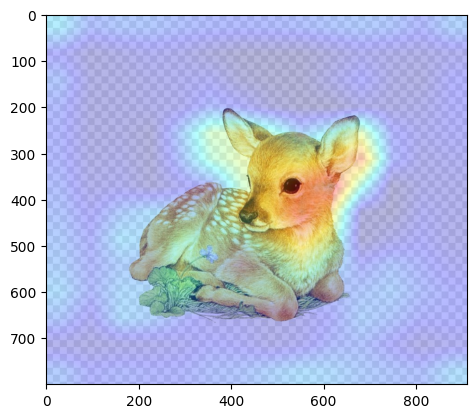

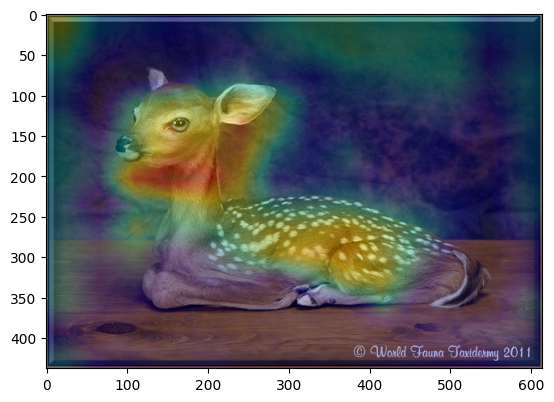

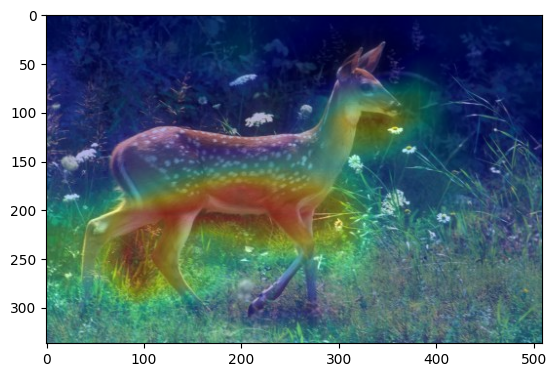

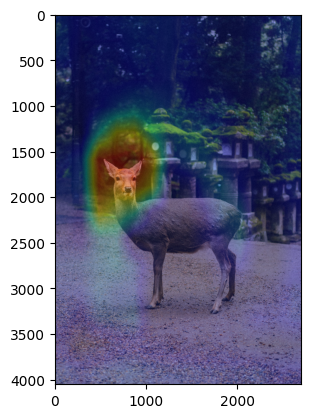

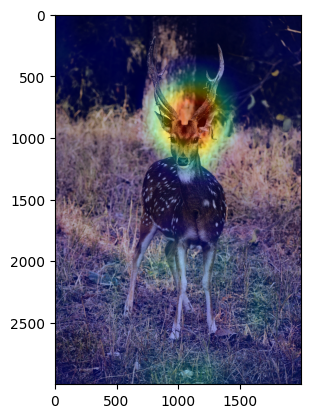

...

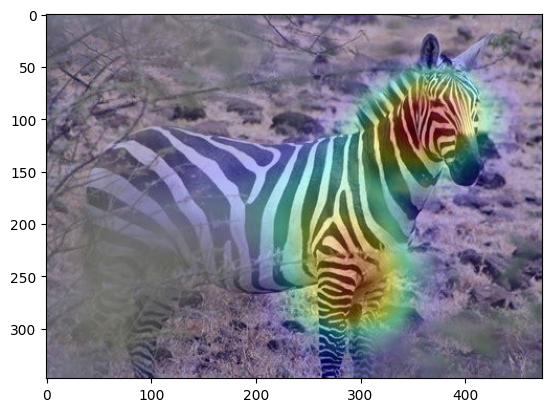

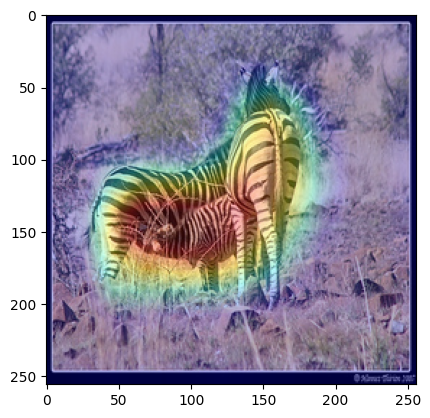

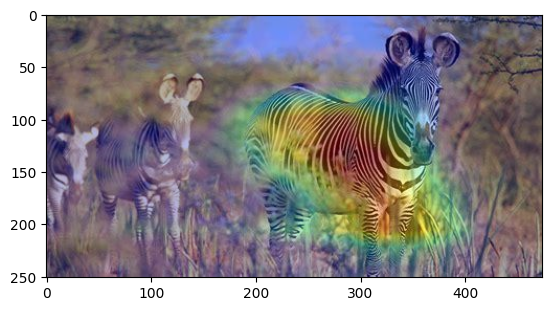

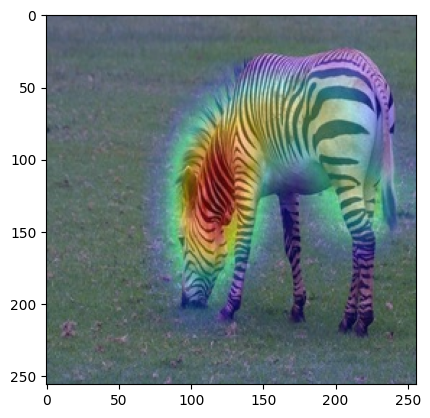

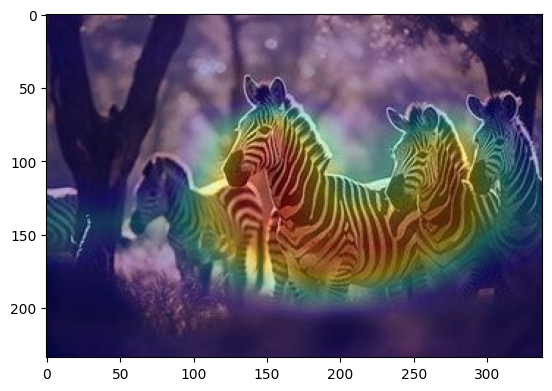

In [58]:
if __name__ == '__main__':
    # Load pre-trained VGG16 model
    #Get the last convolution layer name
    target_layer = find_last_conv_layer_pytorch(model)[1]  # Get the last convolutional layer
    print(target_layer)
    # Initialize GradCAM
    grad_cam = GradCAM(model, target_layer)
    save_dir = os.path.join('./gradcam', MODEL_NAME,  'before')
    for i in range(num_classes):
        os.makedirs(save_dir +f'/{i}', exist_ok=True)        
    xai_gradcam_explainer(model, num_classes,grad_cam, save_dir)

    target_layer = find_last_conv_layer_pytorch(model_modified)[1]  # Get the last convolutional layer
    print(target_layer)
    grad_cam = GradCAM(model_modified, target_layer)
    save_dir = os.path.join('./gradcam', MODEL_NAME,  'after')
    for i in range(num_classes):
        os.makedirs(save_dir +f'/{i}', exist_ok=True)   
    xai_gradcam_explainer(model_modified, num_classes,grad_cam, save_dir)
    
